**YOUR NAMES HERE**

Fall 2019

CS343: Neural Networks

Project 5: Word embeddings and SOMs

In [339]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import word2vec

plt.style.use(['seaborn-colorblind', 'seaborn-darkgrid'])
plt.rcParams.update({'font.size': 20})

np.set_printoptions(suppress=True, precision=3)

# Automatically reload external modules
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Task 3) Implement a Self-Organizing Map (SOM) neural network

You will implement a SOM to visualize the word embeddings in 2D.

Implement the method stubs in `som.py`. I suggest working in the following order:
- constructor
- `compute_decayed_param`. Equation is $$p(t) = p\times exp \left (-t / \left ( \frac{T}{2} \right ) \right ) $$ Above, $p$ is the parameter (e.g. learning rate), $t$ is the current training iteration, $T$ is the total number of training iterations.
- `gaussian`.  Equation is: $$g(r, c) = \alpha(t)\times exp \left (- \left (|| M_{x,y} - (c,r) || \right ) / \left ( 2 \sigma^2 \right ) \right ) $$Above, $\alpha(t)$ is the current (decayed) learning rate, $M_{x,y}$ is the BMU neighborhood grid of (x,y) ordered pairs of SOM unit indices/positions, $(c,r)$ is the center of the Gaussian (BMU column, row position), and $\sigma$ is the current (decayed) standard deviation, $||\cdot||$ is the $L^2$ norm (over x,y values).
- `fit`
- `get_bmu`
- `get_nearest_wts`
- `update_wts`. SOM update rule is $$\vec{w_{rc}}(t) = \vec{w_{rc}}(t-1) + g(r_{bmu}, c_{bmu})\left ( \vec{\text{input_i}} - \vec{w_{rc}}(t-1)\right )$$Above, $w_{rc}$ is the SOM weight vector belonging to the unit positioned at row $r$ and column $c$, $t$ is iteration number, $g(r_{bmu}, c_{bmu})$ is the Gaussian neighborhood matrix centered on the BMU evaluated at the SOM $(row, col) = (r, c)$, $\text{input_i}$ is the data vector. NOTE: This weight update occurs to ALL SOM unit rows and columns $(r, c)$ at time t (due to the Gaussian neighborhood function).
- `error`
- `u_matrix`

As you implement, use the below code to test your implementation. This starts with simple toy data, then on the Iris dataset.

### a. Test implementation

In [3]:
import som

#### Test constructor

In [3]:
som_sz = 3
n_features = 2
max_iter = 10

np.random.seed(0)

test_som = som.SOM(som_sz, n_features, max_iter)
print(f'Your SOM initial weights (shape: {test_som.get_wts().shape}) are\n{test_som.get_wts()}')

Your SOM initial weights (shape: (3, 3, 2)) are
[[[ 0.975  0.221]
  [ 0.4    0.916]
  [ 0.886 -0.464]]

 [[ 0.988 -0.157]
  [-0.244  0.97 ]
  [ 0.099  0.995]]

 [[ 0.987  0.158]
  [ 0.799  0.601]
  [ 0.991 -0.136]]]


You should see:

    Your SOM initial weights (shape: (3, 3, 2)) are
    [[[ 0.975  0.221]
      [ 0.4    0.916]
      [ 0.886 -0.464]]

     [[ 0.988 -0.157]
      [-0.244  0.97 ]
      [ 0.099  0.995]]

     [[ 0.987  0.158]
      [ 0.799  0.601]
      [ 0.991 -0.136]]]

In [4]:
print(f'Shapes of your BMU neighborhood x {test_som.bmu_neighborhood_x.shape} and y {test_som.bmu_neighborhood_y.shape}.')
print('They should be (3, 3), (3, 3), and (3, 3)')
min_x, max_x = test_som.bmu_neighborhood_x.min(), test_som.bmu_neighborhood_x.max()
min_y, max_y = test_som.bmu_neighborhood_y.min(), test_som.bmu_neighborhood_y.max()
print(f'min/max of your x, y neighborhood grids are {min_x}/{max_x}, {min_y}/{max_y}')
print('They should be 0/2, 0/2')
print(test_som.bmu_neighborhood_x)

Shapes of your BMU neighborhood x (3, 3) and y (3, 3).
They should be (3, 3), (3, 3), and (3, 3)
min/max of your x, y neighborhood grids are 0/2, 0/2
They should be 0/2, 0/2
[[0 1 2]
 [0 1 2]
 [0 1 2]]


#### Test learning rate decay function

In [5]:
vec = np.arange(10)
print(test_som.compute_decayed_param(vec, 1))
print(test_som.compute_decayed_param(20, vec[::-1]))

[1.    0.819 0.67  0.549 0.449 0.368 0.301 0.247 0.202 0.165]
[0.165 0.147 0.128 0.11  0.092 0.073 0.055 0.037 0.018 0.   ]


You should see:

    [1.    0.819 0.67  0.549 0.449 0.368 0.301 0.247 0.202 0.165]
    [0.165 0.147 0.128 0.11  0.092 0.073 0.055 0.037 0.018 0.   ]

#### Test Gaussian neighborhood function

##### Test 1

In [6]:
cent_xy = (1, 1)
sigma = 1.0
lr = 1.0
print(test_som.gaussian(cent_xy, sigma, lr))

[[0.368 0.607 0.368]
 [0.607 1.    0.607]
 [0.368 0.607 0.368]]


The Test 1 Gaussian neighborhood should look like:

    [[0.368 0.607 0.368]
     [0.607 1.    0.607]
     [0.368 0.607 0.368]]

##### Test 2

In [7]:
cent_xy = (0, 1)
print(test_som.gaussian(cent_xy, sigma, lr))

[[0.607 1.    0.607]
 [0.368 0.607 0.368]
 [0.082 0.135 0.082]]


The Test 2 Gaussian neighborhood should look like:

    [[0.607 1.    0.607]
     [0.368 0.607 0.368]
     [0.082 0.135 0.082]]

##### Test 3

In [8]:
cent_xy = (0, 1)
sigma = 0.5
print(test_som.gaussian(cent_xy, sigma, lr))

[[0.135 1.    0.135]
 [0.018 0.135 0.018]
 [0.    0.    0.   ]]


The Test 3 Gaussian neighborhood should look like:

    [[0.135 1.    0.135]
     [0.018 0.135 0.018]
     [0.    0.    0.   ]]

##### Test 4

In [9]:
cent_xy = (0, 1)
sigma = 0.5
lr = 0.5
print(test_som.gaussian(cent_xy, sigma, lr))

[[0.068 0.5   0.068]
 [0.009 0.068 0.009]
 [0.    0.    0.   ]]


The Test 4 Gaussian neighborhood should look like:

    [[0.068 0.5   0.068]
     [0.009 0.068 0.009]
     [0.    0.    0.   ]]

#### Test `get_nearest_wts` and  `get_bmu`

In [10]:
test_vec1 = np.array([0.916, 0.4])
test_vec1 = test_vec1[np.newaxis, ...]
test_som.get_nearest_wts(test_vec1)
print(f'The nearest wt vector to [0.916, 0.4] is {test_som.get_nearest_wts(test_vec1)[0]} and should be [0.975 0.221]')
test_vec2 = np.array([-1, -1])
test_vec2 = test_vec2[np.newaxis, ...]
print(f'The nearest wt vector to [-1, -1] is {test_som.get_nearest_wts(test_vec2)[0]} and should be [ 0.886 -0.464]')

The nearest wt vector to [0.916, 0.4] is [0.975 0.221] and should be [0.975 0.221]
The nearest wt vector to [-1, -1] is [ 0.886 -0.464] and should be [ 0.886 -0.464]


#### Test `update_wts`

In [11]:
np.random.seed(0)
som_sz = 3 # 5, 5
n_features = 2
max_iter = 10
t = 1

test_som = som.SOM(som_sz, n_features, max_iter)

input_vector = np.array([1, 1])
bmu_xy = (1, 1)

test_som.update_wts(t, input_vector, bmu_xy)
print(f'Weights after update are:\n{test_som.get_wts()}')

Weights after update are:
[[[ 0.979  0.347]
  [ 0.498  0.93 ]
  [ 0.904 -0.228]]

 [[ 0.99   0.031]
  [-0.04   0.975]
  [ 0.245  0.996]]

 [[ 0.989  0.294]
  [ 0.832  0.666]
  [ 0.992  0.047]]]


    Weights after update are:
    [[[ 0.979  0.347]
      [ 0.498  0.93 ]
      [ 0.904 -0.228]]

     [[ 0.99   0.031]
      [-0.04   0.975]
      [ 0.245  0.996]]

     [[ 0.989  0.294]
      [ 0.832  0.666]
      [ 0.992  0.047]]]

#### Test U-matrix

In [12]:
np.random.seed(0)
som_sz = 3 # 3, 3
n_features = 2
max_iter = 10

test_som = som.SOM(som_sz, n_features, max_iter)

In [13]:
print(f'Your U-matrix is:\n{test_som.u_matrix()}')

Your U-matrix is:
[[0.267 0.448 0.487]
 [0.43  1.    0.449]
 [0.224 0.387 0.38 ]]


Your output should be:
    
    Your U-matrix is:
    [[0.267 0.448 0.487]
     [0.43  1.    0.449]
     [0.224 0.387 0.38 ]]

### b. Test `fit` with Iris dataset

You will use the Iris dataset to test your `fit` function. Your goal is to qualitatively (roughly) reproduce the example image on Wikipedia (below).

- Preprocess the data in the pandas Dataframe below to produce `iris_x` (training data) and `iris_y` (classes).
    - For the training data, pull out all columns except for "species", then normalize each row by its Euclidean distance so that each vector sums to 1. Convert it from Dataframe to ndarray.
    - For the classes, convert to "species" column to an int-code (e.g. values take on 0, 1, 2). Convert from Dataframe to ndarray. 

In [77]:
iris = pd.read_csv('https://raw.githubusercontent.com/mwaskom/seaborn-data/master/iris.csv')
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [78]:
# make iris_x
iris_x = iris.iloc[: , [0,1,2 ,3]]
iris_x = iris_x.to_numpy()
print(iris_x.shape)
iris_x = iris_x/np.sqrt(np.sum(np.square(iris_x), axis = 1, keepdims = True))

(150, 4)


In [79]:
# make iris_y
iris['species'] = pd.Categorical(iris['species'])

# replace strings with their int codes
iris_y = iris['species'].cat.codes
iris_y = iris_y.to_numpy()

#### Test Iris preprocessing

In [80]:
print(f'1st 4 rows of preprocessed iris:\n{iris_x[:4]}\n')
print(f'First 4 classes of iris:\n{iris_y[:4]}\n')
print(f'Last 4 classes of iris:\n{iris_y[-4:]}\n')

1st 4 rows of preprocessed iris:
[[0.804 0.552 0.221 0.032]
 [0.828 0.507 0.237 0.034]
 [0.805 0.548 0.223 0.034]
 [0.8   0.539 0.261 0.035]]

First 4 classes of iris:
[0 0 0 0]

Last 4 classes of iris:
[2 2 2 2]



Output should look like:

    1st 4 rows of preprocessed iris:
    [[0.804 0.552 0.221 0.032]
     [0.828 0.507 0.237 0.034]
     [0.805 0.548 0.223 0.034]
     [0.8   0.539 0.261 0.035]]

    First 4 classes of iris:
    [0 0 0 0]

    Last 4 classes of iris:
    [2 2 2 2]

##### Test `fit`, `u_matrix` after different number of training iterations

In [82]:
som_sz = 7
n_features = 4
max_iter = 1

np.random.seed(0)

iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=0.2, init_sigma=10.0, verbose=False)
iris_u_map0 = iris_som.u_matrix()
iris_som.fit(iris_x.copy())
iris_u_map = iris_som.u_matrix()
print(f'Quantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')
print(f'Your initial u-matrix is (before any training):\n{iris_u_map0}')
print(f'Your u-matrix is (after 1 step):\n{iris_u_map}\n')

max_iter = 100
iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=0.2, init_sigma=10.0, verbose=False)
iris_som.fit(iris_x.copy())
iris_u_map2 = iris_som.u_matrix()
print(f'Quantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')
print(f'Your u-matrix is (after 100 steps):\n{iris_u_map2}')

max_iter = 1000
iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=0.2, init_sigma=10.0, verbose=False)
iris_som.fit(iris_x.copy())
print(f'\nQuantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')
print(f'Your u-matrix is (after 1000 steps):\n{iris_u_map2}')



Quantization error after 1 iterations: 0.15
Your initial u-matrix is (before any training):
[[0.268 0.495 0.516 0.496 0.635 0.582 0.39 ]
 [0.538 0.956 0.931 0.794 0.776 0.771 0.464]
 [0.506 0.911 0.831 0.988 1.    0.751 0.502]
 [0.524 0.771 0.748 0.85  0.879 0.886 0.618]
 [0.405 0.745 0.755 0.714 0.782 0.907 0.586]
 [0.586 0.798 0.733 0.761 0.801 0.959 0.494]
 [0.311 0.508 0.44  0.409 0.48  0.548 0.417]]
Your u-matrix is (after 1 step):
[[0.263 0.485 0.508 0.492 0.635 0.588 0.395]
 [0.528 0.937 0.917 0.787 0.776 0.778 0.472]
 [0.496 0.894 0.819 0.979 1.    0.757 0.51 ]
 [0.516 0.759 0.74  0.846 0.882 0.896 0.628]
 [0.402 0.739 0.752 0.715 0.79  0.923 0.6  ]
 [0.585 0.798 0.737 0.766 0.814 0.983 0.511]
 [0.312 0.511 0.445 0.415 0.491 0.565 0.433]]

1
Quantization error after 100 iterations: 0.06
Your u-matrix is (after 100 steps):
[[0.171 0.336 0.321 0.282 0.224 0.163 0.085]
 [0.432 0.649 0.6   0.52  0.415 0.327 0.165]
 [0.543 0.839 0.786 0.683 0.555 0.438 0.246]
 [0.624 0.975 0.954 0.8

You should see:

    Quantization error after 1 iterations: 0.14
    Your initial u-matrix is (before any training):
    [[0.268 0.495 0.516 0.496 0.635 0.582 0.39 ]
     [0.538 0.956 0.931 0.794 0.776 0.771 0.464]
     [0.506 0.911 0.831 0.988 1.    0.751 0.502]
     [0.524 0.771 0.748 0.85  0.879 0.886 0.618]
     [0.405 0.745 0.755 0.714 0.782 0.907 0.586]
     [0.586 0.798 0.733 0.761 0.801 0.959 0.494]
     [0.311 0.508 0.44  0.409 0.48  0.548 0.417]]
    Your u-matrix is (after 1 step):
    [[0.263 0.485 0.508 0.492 0.635 0.588 0.395]
     [0.528 0.937 0.917 0.787 0.776 0.778 0.472]
     [0.496 0.894 0.819 0.979 1.    0.757 0.51 ]
     [0.516 0.759 0.74  0.846 0.882 0.896 0.628]
     [0.402 0.739 0.752 0.715 0.79  0.923 0.6  ]
     [0.585 0.798 0.737 0.766 0.814 0.983 0.511]
     [0.312 0.511 0.445 0.415 0.491 0.565 0.433]]

    Quantization error after 100 iterations: 0.08
    Your u-matrix is (after 100 steps):
    [[0.049 0.21  0.419 0.606 0.648 0.583 0.298]
     [0.152 0.333 0.649 0.92  0.979 0.874 0.392]
     [0.215 0.488 0.71  0.96  1.    0.856 0.363]
     [0.435 0.719 0.9   0.98  0.966 0.798 0.38 ]
     [0.611 0.957 0.977 0.967 0.849 0.685 0.333]
     [0.668 0.999 0.957 0.853 0.722 0.552 0.241]
     [0.323 0.475 0.478 0.446 0.382 0.296 0.135]]

    Quantization error after 1000 iterations: 0.03

##### Have SOM learn structure of Iris data

If all goes well, your u-map superimposed with the most active units for each training sample should (qualitatively) look like the lower-right image on Wikipedia: https://en.wikipedia.org/wiki/Self-organizing_map#/media/File:SOM_of_Fishers_Iris_flower_data_set.JPG

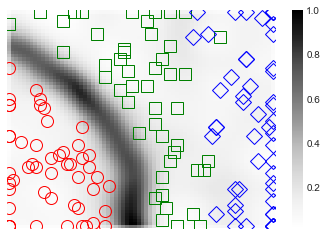

Quantization error after 100000 iterations: 0.01


In [112]:
som_sz = 70
n_features = 4
max_iter = 100000

np.random.seed(0)

iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=3, init_sigma=51.0, verbose=False)
iris_som.fit(iris_x.copy())
iris_u_map = iris_som.u_matrix()

plt.pcolor(iris_u_map.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])

markers = ['o','s','D']
colors = ['r','g','b']

for i in range(len(iris_x)):
    bmu_pos = iris_som.get_bmu(iris_x[i])
    plt.plot(bmu_pos[0] + 0.5,
             bmu_pos[1] + 0.5,
             markers[iris_y[i]],
             markeredgecolor=colors[iris_y[i]],
             markersize=12,
             markerfacecolor='None')
plt.show()
print(f'Quantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')

## Testing out different hyperparameters

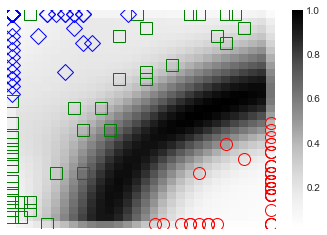

Quantization error after 100 iterations: 0.03


In [131]:
#testing parameters
som_sz = 30
n_features = 4
max_iter = 100

iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=3, init_sigma=51.0, verbose=False)
iris_som.fit(iris_x.copy())
iris_u_map = iris_som.u_matrix()

plt.pcolor(iris_u_map.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])

markers = ['o','s','D']
colors = ['r','g','b']

for i in range(len(iris_x)):
    bmu_pos = iris_som.get_bmu(iris_x[i])
    plt.plot(bmu_pos[0] + 0.5,
             bmu_pos[1] + 0.5,
             markers[iris_y[i]],
             markeredgecolor=colors[iris_y[i]],
             markersize=12,
             markerfacecolor='None')
plt.show()
print(f'Quantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')

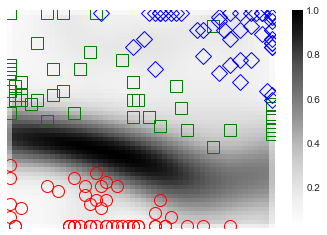

Quantization error after 100 iterations: 0.02


In [178]:
som_sz = 50
n_features = 4
max_iter = 100
iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=3, init_sigma=51.0, verbose=False)
iris_som.fit(iris_x.copy())
iris_u_map = iris_som.u_matrix()

plt.pcolor(iris_u_map.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])

markers =  ['o','s','D']
colors = ['r','g','b']

for i in range(len(iris_x)):
    bmu_pos = iris_som.get_bmu(iris_x[i])
    plt.plot(bmu_pos[0] + 0.5,
             bmu_pos[1] + 0.5,
             markers[iris_y[i]],
             markeredgecolor=colors[iris_y[i]],
             markersize=12,
             markerfacecolor='None')
plt.show()
print(f'Quantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')

- **Question 3**: What do the different shaped/colored plot markers represent in the visualization?
- **Question 4**: Explain what the above visualizaion is showing us. Why does the plot look different than Iris scatterplots like you're used to seeing? 
- **Question 5**: How do we make use of the Iris classes (species) in the above visualization? Does training depend on them?
- **Question 6**: Copy the plot with default hyperparameters into a separate cell (or save it in your project folder). Then play around with the hyperparameters. Report on what how each affects the map. Does it matter that the clusters may jump around? Explain why.
- **Question 7**: How stable are the hyperparameters in generating distinct clusters? Back up your observations with some numbers (i.e. parameter ranges ranges, things you experimented with).
- **Question 8**: See what happens when you shrink the map size. What's the consequence for classifying new data with the smaller map size?

3. Each plot markers represents a species of Iris. 
4. What the SOM is doing is representing a multi-dimensional plot into a 2D plot. We are used to seeing plots with an x axis and y axis representing specific variables of the dataset. Whereas, there isn't as easily defined axis since we are matching the closest wts to the input wts and then changing the wts of the bmu and nearby wts. So the visualization is clustering closely related species. 
5. SOM is unsupervised so whether a class is correct or not does not apply. We can use class in plotting the data to see how different classes are grouped with each other. 
6. Keeping size constant at 70, we see that decreasing the iterations to below a 100 led to the clusters of different species looking less stable, however, distinct species were clustered with each others still. When we went to below 25 iterations, while distinct species were still clustered near each other, the barriers between species weren't as clear. Given that we are randomly initializing the wts, the spots of the clusters don't matter as much as which points are near each other on the plot. 
7. We reran the som several times with size at 50 and iterations at 100. We found that in every try (20+), we see the red and blue points clustered on opposite ends and green being in the middle near the black line. So it seems that the hyperparameters are stable. 
8. Decreasing the size, we see that the clarity of the plot also drops down, similar to decreasing iteartions, and the data points seemed more lined up across the edges of the plot.

### c. Visualize word embedding vectors

The below parameters should work out-of-the-box for creating a "word cloud" of the IMDb word embedding vectors. Tweak as needed.

In [73]:
word_vectors = np.load('results/imdb_word_vectors.npy')
word_strings = np.load('results/imdb_word_strings.npy')
 
print(f'Loaded {len(word_vectors)} word embedding vectors and {len(word_strings)} words.')

Loaded 1016 word embedding vectors and 1016 words.


#### Train the SOM on word vectors and look at the U-matrix

- Create a SOM object, fit it to the word vectors, get the U-matrix (`word_u_map`), use the below code to plot it.

Training should take around 1 minutes or less with the following default parameters:

- size of SOM (in either x or y): 100
- max iterations: 100,000
- learning rate: 2
- initial Gaussian neighborhood standard deviation: 40

The U-matrix should have structure to it (not look like salt-and-pepper pixel noise or be completely black/white/gray)

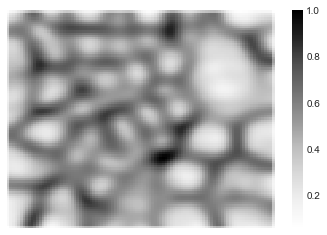

In [250]:
# Make SOM here, train it, etc
som_sz = 100
n_features = 10
max_iter = 100000
imbd_som = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som.fit(word_vectors.copy())
word_u_map = imbd_som.u_matrix()



plt.pcolor(word_u_map.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

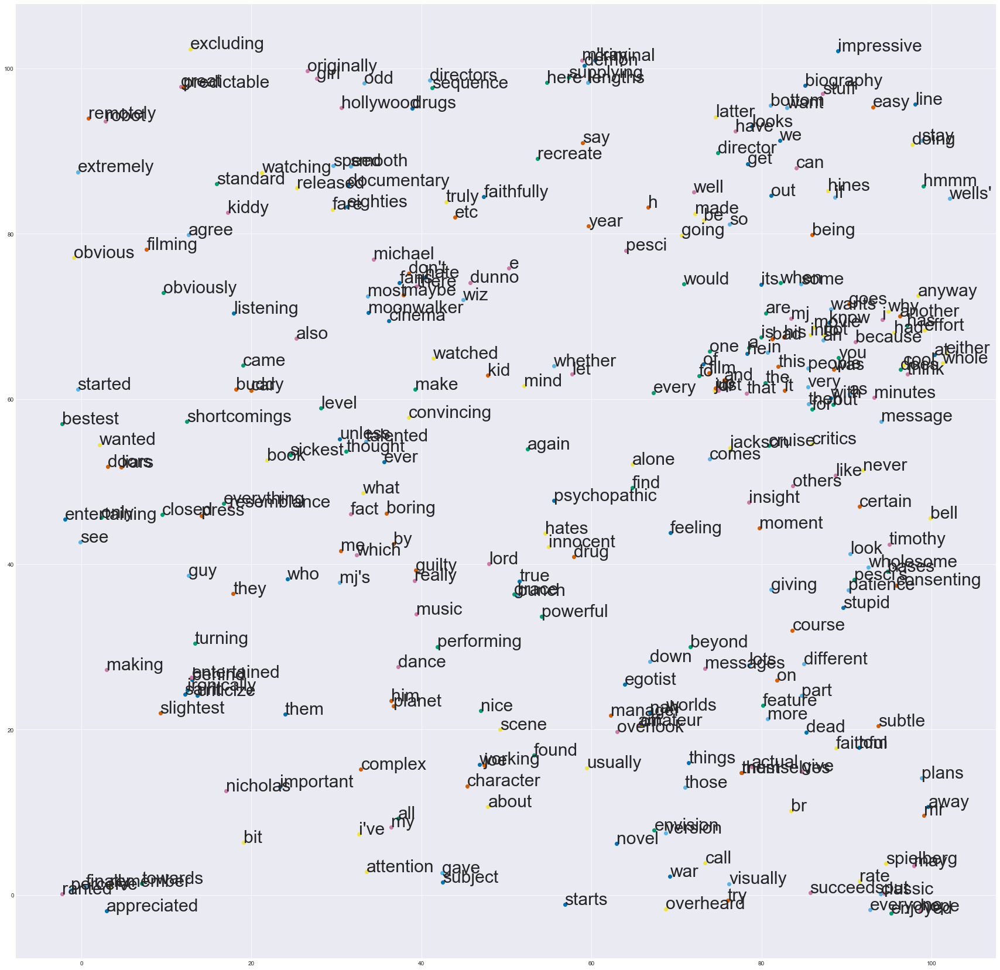

Quantization error after 100000 iterations: 2.00


In [251]:
num_words_to_visualize = 300
jitter = 3

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()
print(f'Quantization error after {max_iter} iterations: {imbd_som.error(word_vectors.copy()):.2f}')

**Question 9:** What are your favorite word clusters? Are there any word groupings that surprised you (but make sense post-hoc)?

**Question 10:** How does the number of iterations affect the apparent quality of the word vector mapping? For example, does the visualization make sense when you decrease/increase the iteration count? How stable does it seem? Does it break down at any point?

9. We found "hollywood" and "drugs" near each other as pretty interesting. We also saw a cluster with "michael", "jackson" and "moonwalked". One interesting cluster was "hate" and "faithfulling" being close to each others. We're still trying to make sense of it, perhaps movie critics faithfully hate certain kinds of movies. 

10. We see that lower number of iterations lead to larger clusters of data. We see after 10,000 iterations, we consistently get similar word cloud maps in terms of quality. At around 1000 iterations, we start seeing word clouds that don't make as sense compared to higher iterations. As we go down, we get really large clusters that makes it harder to link words together. The consistency seems to jump around 1000 iter with some word clouds looking ok while others look pretty hard to interpret. Below 1000 iter, we consisistenly get large clumps. We also see our quantization error consistently rise as iterations decrease. 

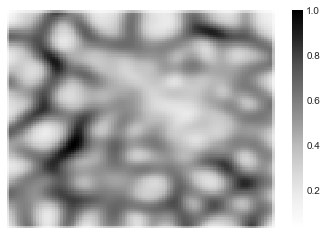

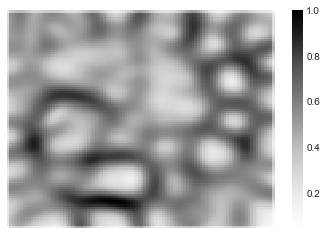

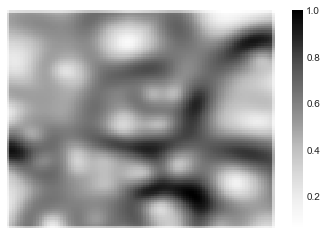

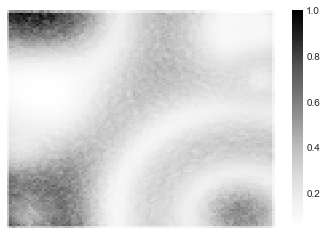

In [263]:
# testing different iterations
som_sz = 100
n_features = 10
max_iter = 10000
imbd_som2 = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som2.fit(word_vectors.copy())
word_u_map2 = imbd_som2.u_matrix()
 
plt.pcolor(word_u_map2.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

max_iter = 1000
imbd_som3 = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som3.fit(word_vectors.copy())
word_u_map3 = imbd_som3.u_matrix()
 
plt.pcolor(word_u_map3.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

max_iter = 100
imbd_som4 = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som4.fit(word_vectors.copy())
word_u_map4 = imbd_som4.u_matrix()



plt.pcolor(word_u_map4.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()


max_iter = 10
imbd_som5 = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som5.fit(word_vectors.copy())
word_u_map5 = imbd_som5.u_matrix()



plt.pcolor(word_u_map5.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

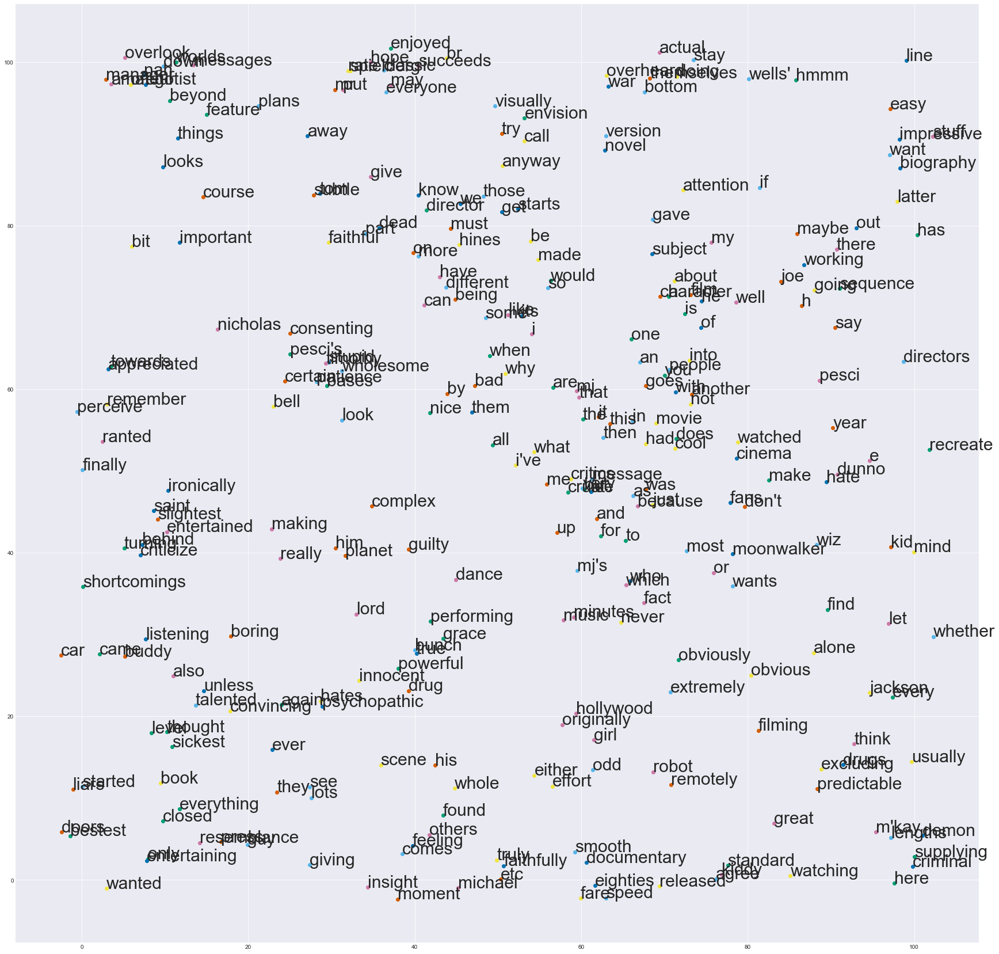

Quantization error after 10 iterations: 2.09


In [264]:
#10000 iter
num_words_to_visualize = 300
jitter = 3

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som2.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()
print(f'Quantization error after {max_iter} iterations: {imbd_som2.error(word_vectors.copy()):.2f}')
 

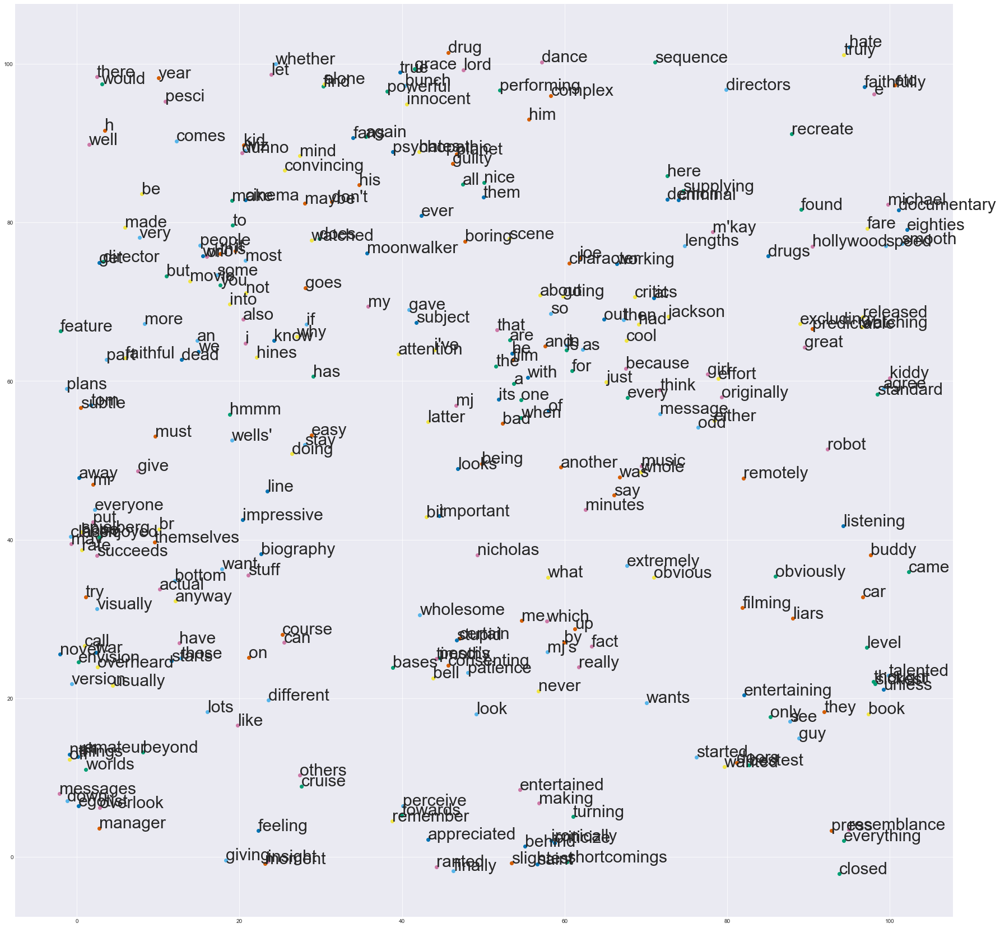

Quantization error after 10 iterations: 2.39


In [265]:
#1000 iter 
fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som3.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()
print(f'Quantization error after {max_iter} iterations: {imbd_som3.error(word_vectors.copy()):.2f}')


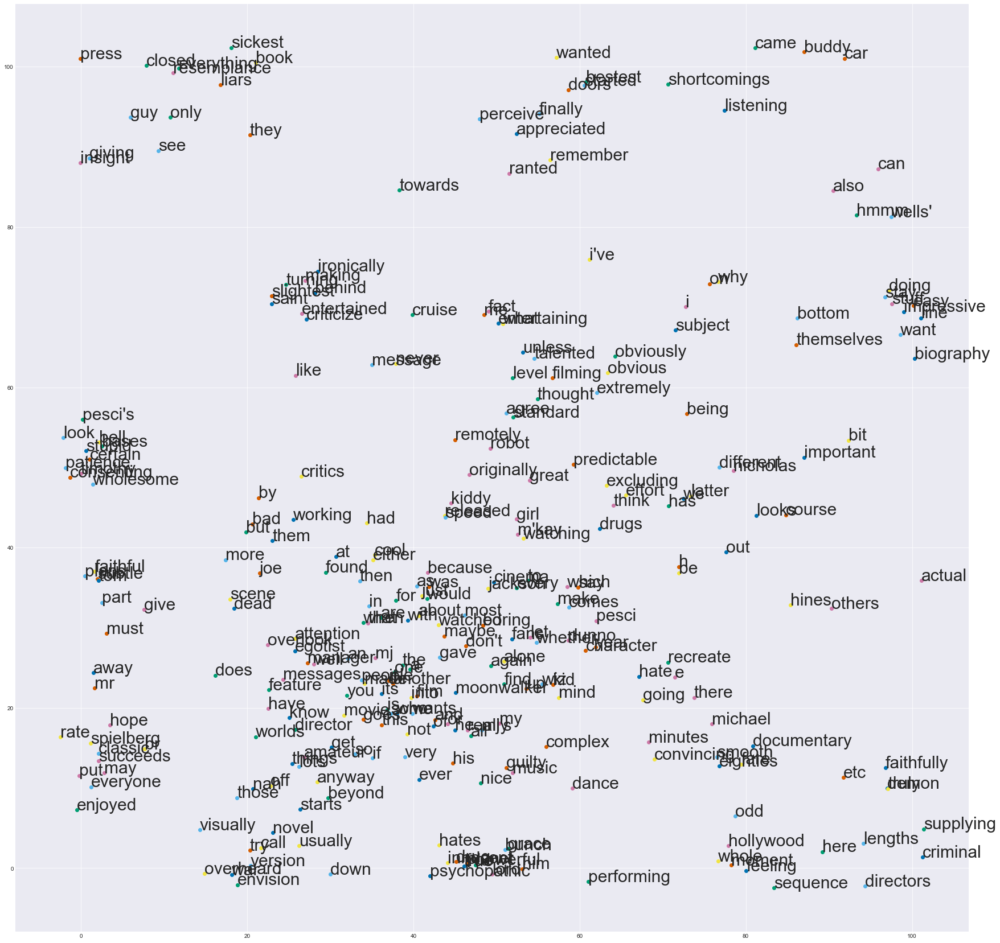

Quantization error after 10 iterations: 3.06


In [266]:
#100 iter 

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som4.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()
print(f'Quantization error after {max_iter} iterations: {imbd_som4.error(word_vectors.copy()):.2f}')

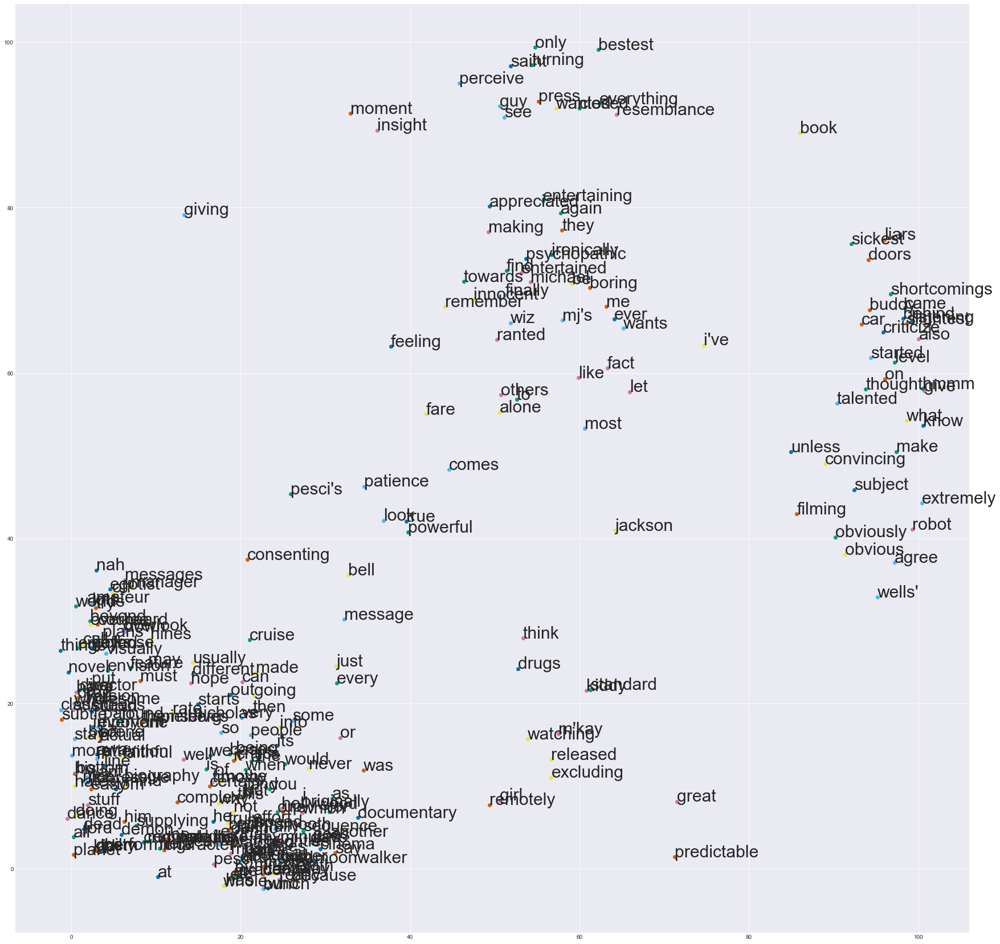

Quantization error after 10 iterations: 4.36


In [267]:
#10 iter
fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som5.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()
print(f'Quantization error after {max_iter} iterations: {imbd_som5.error(word_vectors.copy()):.2f}')
 

## Extensions

### 1. Other SOM initialization schemes

Other initialization schemes initialize the SOM weights to random values in the training set or according to the 1st two principle components of the data. Investigate how these affect the stablity and convergence of the network weights. 

We implemented principle component analysis and used the first 2 components in our som. 

In [94]:
som_sz = 7
n_features = 4
max_iter = 1

np.random.seed(0)
iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=0.2, init_sigma=10.0, verbose=False)
iris_som.init_wts_pca(iris_x.copy())
iris_u_map0 = iris_som.u_matrix()
iris_som.fit(iris_x.copy())
iris_u_map = iris_som.u_matrix()
print(f'Quantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')
print(f'Your initial u-matrix is (before any training):\n{iris_u_map0}')
print(f'Your u-matrix is (after 1 step):\n{iris_u_map}\n')

max_iter = 100
iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=0.2, init_sigma=10.0, verbose=False)
iris_som.init_wts_pca(iris_x.copy())
iris_som.fit(iris_x.copy())
iris_u_map2 = iris_som.u_matrix()
print(f'Quantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')
print(f'Your u-matrix is (after 100 steps):\n{iris_u_map2}')

max_iter = 1000
iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=0.2, init_sigma=10.0, verbose=False)
iris_som.init_wts_pca(iris_x.copy())
iris_som.fit(iris_x.copy())
print(f'\nQuantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')
print(f'Your u-matrix is (after 1000 steps):\n{iris_u_map2}')


Quantization error after 1 iterations: 0.79
Your initial u-matrix is (before any training):
[[0.354 0.604 0.604 0.604 0.604 0.604 0.354]
 [0.604 1.    1.    1.    1.    1.    0.604]
 [0.604 1.    1.    1.    1.    1.    0.604]
 [0.604 1.    1.    1.    1.    1.    0.604]
 [0.604 1.    1.    1.    1.    1.    0.604]
 [0.604 1.    1.    1.    1.    1.    0.604]
 [0.354 0.604 0.604 0.604 0.604 0.604 0.354]]
Your u-matrix is (after 1 step):
[[0.352 0.595 0.59  0.588 0.59  0.594 0.351]
 [0.595 0.983 0.976 0.973 0.975 0.982 0.595]
 [0.594 0.981 0.973 0.97  0.973 0.979 0.593]
 [0.595 0.983 0.975 0.973 0.975 0.981 0.594]
 [0.599 0.989 0.982 0.979 0.981 0.988 0.598]
 [0.606 1.    0.993 0.99  0.992 0.999 0.605]
 [0.361 0.606 0.602 0.6   0.601 0.605 0.36 ]]

1
Quantization error after 100 iterations: 0.06
Your u-matrix is (after 100 steps):
[[0.185 0.426 0.53  0.586 0.53  0.388 0.216]
 [0.408 0.706 0.836 0.937 0.903 0.758 0.403]
 [0.371 0.657 0.803 0.946 1.    0.929 0.569]
 [0.312 0.562 0.71  0.8

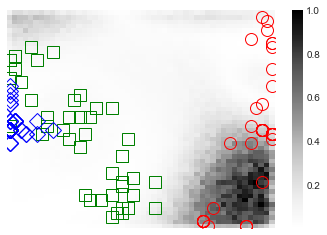

Quantization error after 10 iterations: 0.03


In [224]:
#original som 
som_sz = 50
n_features = 4
max_iter = 10
iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=3, init_sigma=51.0, verbose=False)
iris_som.fit(iris_x.copy())
iris_u_map = iris_som.u_matrix()

plt.pcolor(iris_u_map.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])

markers = ['o','s','D']
colors = ['r','g','b']

for i in range(len(iris_x)):
    bmu_pos = iris_som.get_bmu(iris_x[i])
    plt.plot(bmu_pos[0] + 0.5,
             bmu_pos[1] + 0.5,
             markers[iris_y[i]],
             markeredgecolor=colors[iris_y[i]],
             markersize=12,
             markerfacecolor='None')
plt.show()
print(f'Quantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')

We see that we get a quantitization error of 0.06 after 100 iterations, to further see how our pca did, we plotted our som

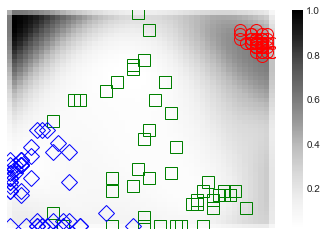

Quantization error after 10 iterations: 0.03


In [249]:
som_sz = 50
n_features = 4
max_iter = 10

iris_som = som.SOM(som_sz, n_features, max_iter, init_lr=3, init_sigma=51.0, verbose=False)
iris_som.init_wts_pca(iris_x.copy())
iris_som.fit(iris_x.copy())
iris_u_map = iris_som.u_matrix()

plt.pcolor(iris_u_map.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])

markers = ['o','s','D']
colors = ['r','g','b']

for i in range(len(iris_x)):
    bmu_pos = iris_som.get_bmu(iris_x[i])
    plt.plot(bmu_pos[0] + 0.5,
             bmu_pos[1] + 0.5,
             markers[iris_y[i]],
             markeredgecolor=colors[iris_y[i]],
             markersize=12,
             markerfacecolor='None')
plt.show()
print(f'Quantization error after {max_iter} iterations: {iris_som.error(iris_x):.2f}')

Looking at the difference between the original and pca-som for the iris dataset, we don't see too much of a difference. We then tried rerunning both som on a really low iteration and saw that the pca som had a bit more consistency with the clustering the points. However, the pca-map still looks like it needs more iterations. Quantization errors for both were about the same, with most som having an error near 0.03. 

With adequate hypermaraters, the iris som already shows a pretty clear som map with both the original and pca som so we also ran our pca on the imdb dataset. 

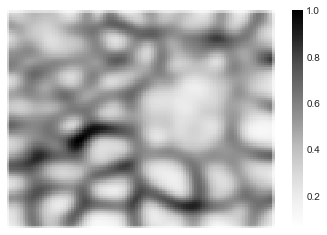

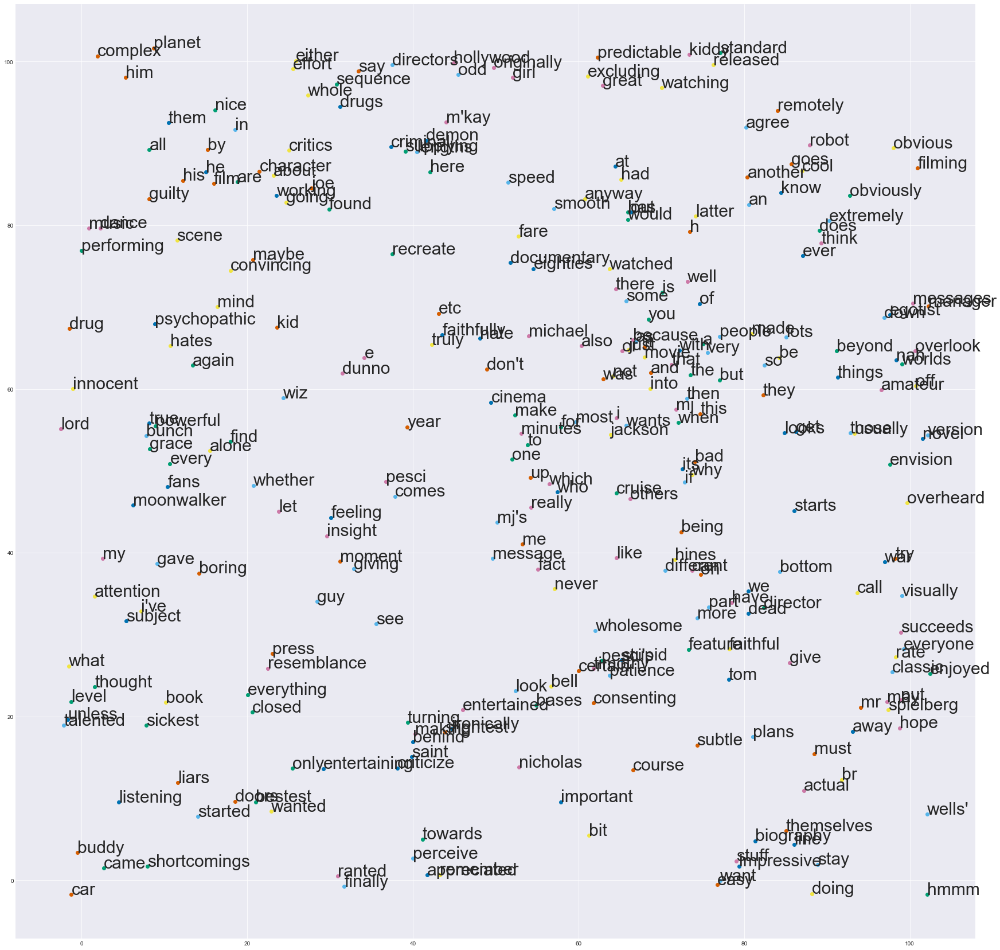

In [95]:
som_sz = 100
n_features = 10
max_iter = 100000
imbd_som = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som.init_wts_pca(word_vectors.copy())
imbd_som.fit(word_vectors.copy())
word_u_map = imbd_som.u_matrix()



plt.pcolor(word_u_map.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()
num_words_to_visualize = 300
jitter = 3

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()
print(f'Quantization error after {max_iter} iterations: {imbd_som.error(word_vectors.copy()):.2f}')

We see that the results are of the word map has a similar structure to our original som and there doesn't seem to be any noticeable changes in our word clouds. One possible reason is because our iteration is so high, the effects of the new initial wts might overshadowed. We wanted to know that if we were in a scenario where a large number of iterations was not practical, would pca be worth implementing. 

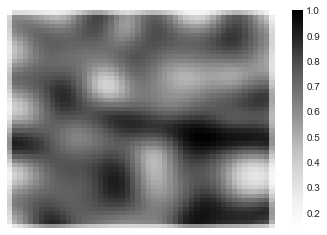

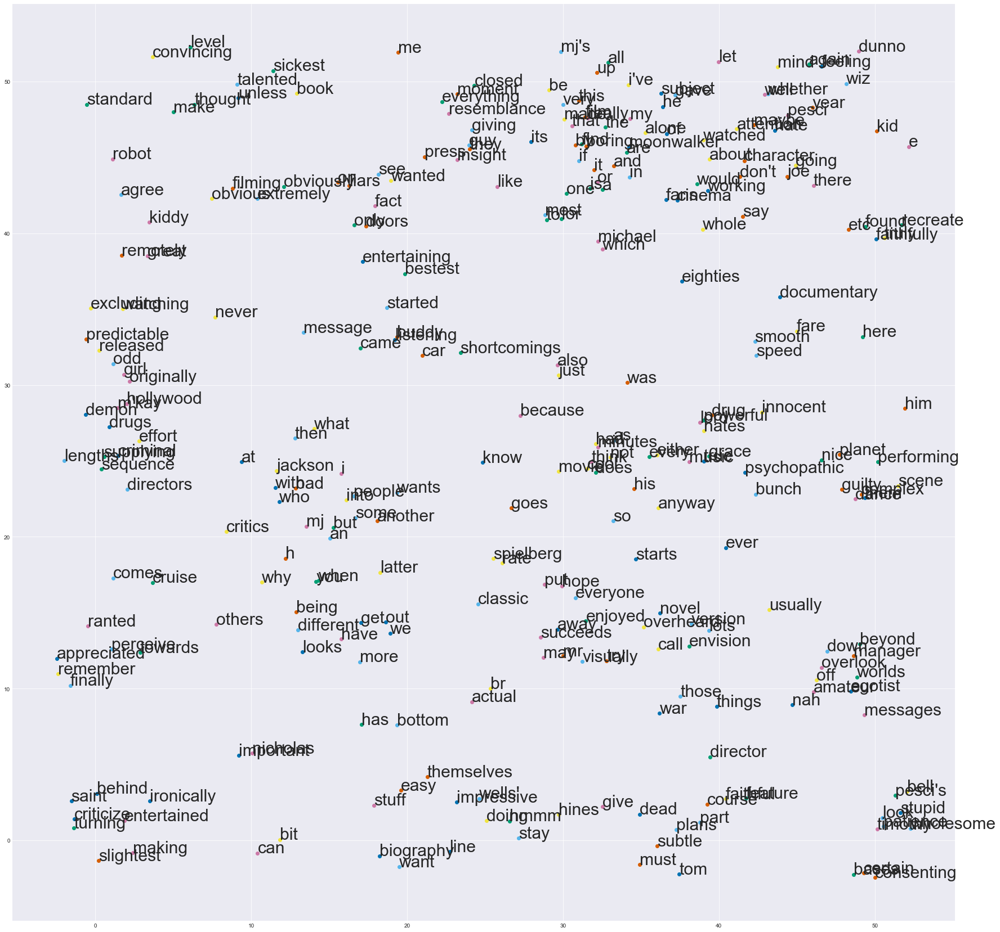

In [99]:
#creating pca-som 
som_sz = 50
n_features = 10
max_iter = 500
imbd_som = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som.init_wts_pca(word_vectors.copy())
imbd_som.fit(word_vectors.copy())
word_u_map = imbd_som.u_matrix()

plt.pcolor(word_u_map.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()
num_words_to_visualize = 300
jitter = 3

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()

In [102]:
#pca-som quantization error 
print(f'Quantization error after {max_iter} iterations: {imbd_som.error(word_vectors.copy()):.2f}')

Quantization error after 500 iterations: 3.26


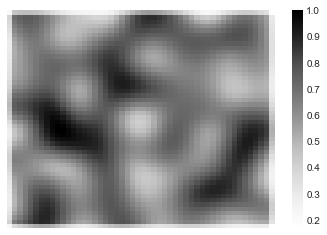

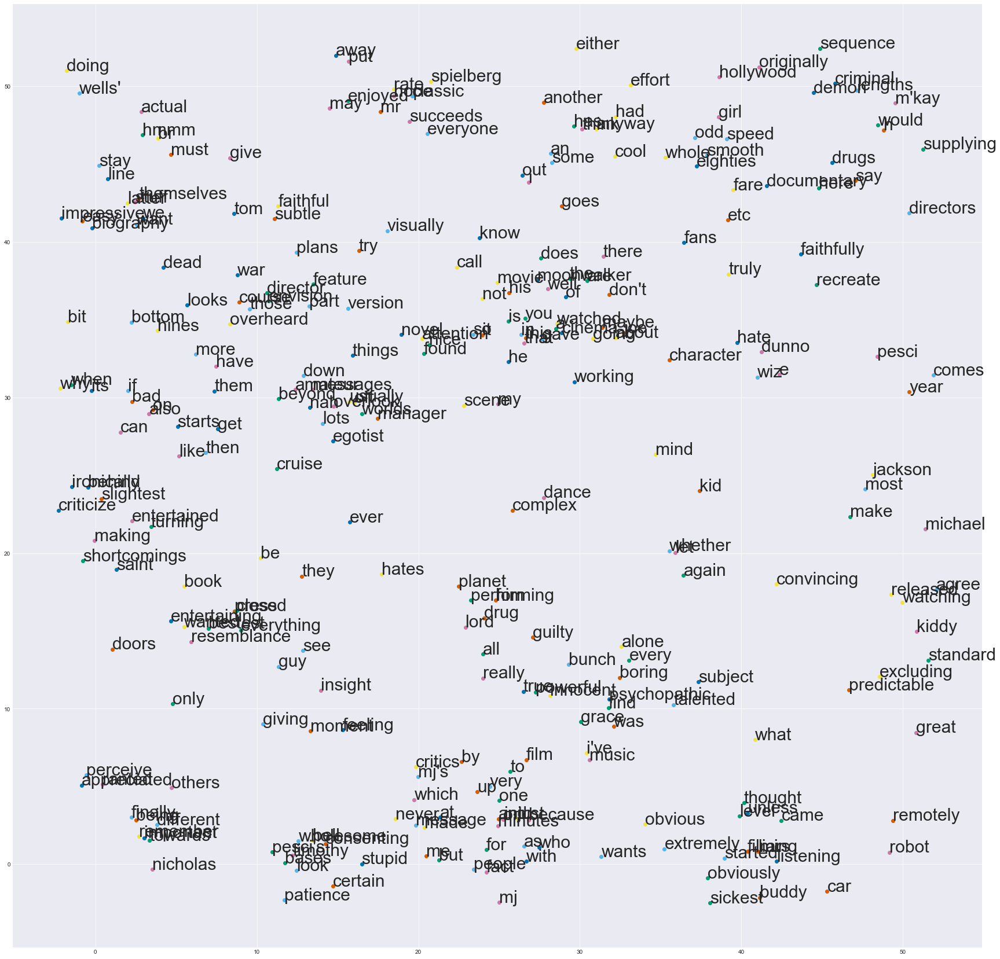

In [103]:
#creating original om 
som_sz = 50
n_features = 10
max_iter = 500
imbd_som = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som.fit(word_vectors.copy())
word_u_map = imbd_som.u_matrix()

plt.pcolor(word_u_map.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()
num_words_to_visualize = 300
jitter = 3

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()

In [104]:
#original som error
print(f'Quantization error after {max_iter} iterations: {imbd_som.error(word_vectors.copy()):.2f}')

Quantization error after 500 iterations: 3.29


The first word cloud is from our pca-som and the second is our original som. After we decreased the iterations to 500, we see that the pca-som had a quantization error of 3.26 compared to the original som with an error of 3.29. Looking at both of the word clouds, they both seem to make up clusters that do have some sense to them such as "criticize" and "shortcomings" near each other. 

### 2. SOM quantization error

Do an analysis (make plots, explain findings) where you investigate how various SOM parameters affect the quantization error. Parameters you might experiment with are:
- iteration count
- SOM size

**NOTE:** Some parameters may need to adjusted together in some fashion. For example, decreasing the SOM size decreases the grid size. Therefore, the Gaussian neighborhood size $\sigma$ probably needs to be rescaled, as does the learning rate (how much vectors move around in the space duing each update).

In [291]:
import matplotlib.pyplot as plt

In [276]:

#creating original om 
som_sz = 50
n_features = 10
max_iter = 100
err = [] 
step_sz = 500

for i in range (50):
    max_iter = max_iter + step_sz
    imbd_som = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
    imbd_som.fit(word_vectors.copy())
    err.append(imbd_som.error(word_vectors.copy()))

In [301]:
x_scale = [100]
for i in range(49):
    x_scale.append(x_scale[-1]+500)
 

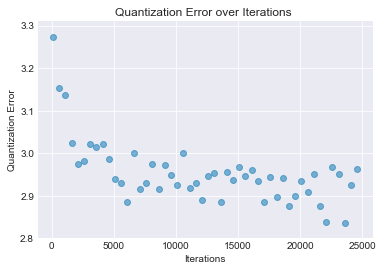

In [302]:
x = x_scale
y = err

plt.scatter(x, y,   alpha=0.5)
plt.title("Quantization Error over Iterations ")
plt.xlabel("Iterations")
plt.ylabel("Quantization Error")
plt.show()

Using our original SOM, when we first ran with 100,000 iterations, we got an error of 3.29 (grid size was 100). Using a som size of 50 and started with an max_iter = 100. Using a forloop, we reran our som and increased max_iter by 500. We see that we already begin to plateau arund 10,000 iterations. We then tested to see if our PCA-som had any different results. From our previous findings, we don't expect much difference in error. 

In [306]:
#creating pca som 
som_sz = 50
n_features = 10
max_iter = 100
err2 = [] 
step_sz = 500

for i in range (50):
    max_iter = max_iter + step_sz
    imbd_som = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
    imbd_som.init_wts_pca(word_vectors.copy())
    imbd_som.fit(word_vectors.copy())
    err2.append(imbd_som.error(word_vectors.copy()))

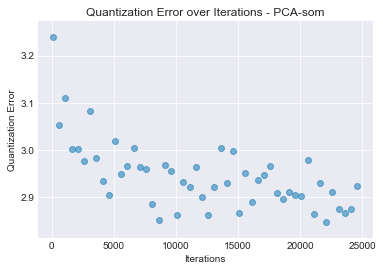

In [307]:
x = x_scale
y = err2

plt.scatter(x, y,   alpha=0.5)
plt.title("Quantization Error over Iterations - PCA-som")
plt.xlabel("Iterations")
plt.ylabel("Quantization Error")
plt.show()

While we aren't sure whether any of the results are statistically or practically different, we did get a wider spread for our errors. Like the original som, we started to plateau around 10,000. Unlike the original, our data points were more spread out apart with both higher and lower errors compared to the original. We accidentally hit run which is why there is an error but we already plotted our results. 

In [328]:
max_iter = 15000
som_sz = 15
n_features = 10
err3 = [] 
step_sz = 15

for i in range (10):
    som_sz = som_sz + step_sz
    imbd_som = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
    imbd_som.fit(word_vectors.copy())
    err3.append(imbd_som.error(word_vectors.copy()))

KeyboardInterrupt: 

In [321]:
print(err3[0:7])

x_scale = [15]
for i in range(9):
    x_scale.append(x_scale[-1]+15)
print(x_scale[0:7])

[3.6861881366873352, 3.072031337260644, 2.618390897050761, 2.3659458228317263, 2.137467333060555, 1.9979338979041332, 1.8727206517929538]
[15, 30, 45, 60, 75, 90, 105]


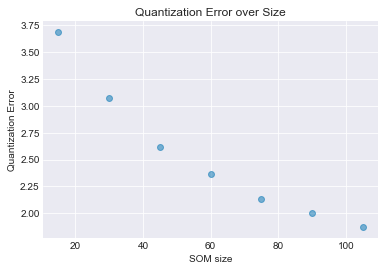

In [327]:
x = x_scale
y = err3

plt.scatter(x, y,   alpha=0.5)
plt.title("Quantization Error over Size")
plt.xlabel("SOM size")
plt.ylabel("Quantization Error")
plt.show()

We got an error when we went over a size of 105 so we decided to cap it off at 105 and then compare it to our pca-som 

In [329]:
max_iter = 15000
som_sz = 15
n_features = 10
err3 = [] 
step_sz = 15

for i in range (10):
    som_sz = som_sz + step_sz
    imbd_som = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
    imbd_som.init_wts_pca(word_vectors.copy())
    imbd_som.fit(word_vectors.copy())
    err3.append(imbd_som.error(word_vectors.copy()))

Similarily with pca-som, after we went above size = 105, we got nan values. We get almost identical graphs which isn't surprising since with an iteration of 15000, we already found previously that once there is an adequate number of iterations, pca does not seem to have much of an effect. 

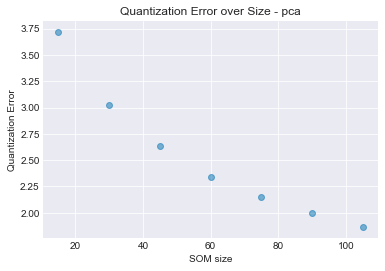

In [332]:
x = x_scale
y = err3
plt.scatter(x, y,   alpha=0.5)
plt.title("Quantization Error over Size - pca")
plt.xlabel("SOM size")
plt.ylabel("Quantization Error")
plt.show()

### 3. More sophisticated text preprocessing

To preprocess text for Skipgram, we defined words as strings with at least one letter. Research and examine whether more sophisticated approaches (e.g. removing stop words, destemming, lemmatization, etc) to preprocessing text yield better word embedding results (better quality word context predictions, better word similiarity as represented by the SOM).

### 4. Skip-gram word context

We only used the Skip-gram network to extract the word embedding vectors. Load in the IMDb test set and explore how a trained Skip-gram network can predict words surrounding each target work. This may require overriding the `predict` function and looking at the softmax values.

### 5. Continuous Bag of Words (CBOW)

In addition to Skip-gram, Mikolov et al. also proposed the CBOW model. Duplicate your Skipgram code and make the necessary modifications to implement CBOW. Note that this requires similar modifications that we made to the output layer, but to the hidden layer. The main change is that we present multiple context word one-hot vectors "at once": compute `y_net_in` for each context word, then average them across the layer (to get a $1\times H$ vector) before computing `y_net_act`. Then proceed like normal with the rest of the forward pass. Because there's one correct class, use standard cross-entropy loss. The backprop process is the same until you get to computing the hidden layer (`y`) `d_wts`. Because we averaged $C$ inputs when computing `y_net_in`, we have the divide `d_wts` by $C$.

- How do the word vectors compare to Skipgram?
- Analyze the target word predictions.

### 6. Removing one-hot vectors from Skip-gram and add mini-batch support

- In our Skip-gram implementation, we one-hot coded all target words upfront. This is wasteful with respect to memory consumption because one-hot input vectors simply select the weights of $i^{th}$ hidden layer unit. Override the `Dense` net_in computation method and modify it to handle int indices.

- Another improvement would be to add mini-batch support to training. This may be easier to implement if you bypass all usage of one-hot vectors.

### 7. Quality of SOM word clusters

Experiment with how SOM learning parameters and Skip-gram training time (and other parameters like # embedding dimensions) affect the quality of similar word cluster.

### 8. Other text datasets

Obtain, load, and preprocess other text datasets. Train Skip-gram, visualize the word vectors using SOM, and interpret what you find.

We first wanted to increase the number of reviews to see the effects of a larger sample. First we tried 20 reviews and kept the number of interior units at 10

In [378]:
df = pd.read_csv('Data/imdb_train.csv', delimiter='\t')

review_txt = df['review'].values.tolist()
R = 20
reviews = review_txt[0:R]
corpus = word2vec.make_corpus(reviews)
print(f'There are {len(corpus)} sentences in the corpus.')
unique_words = word2vec.find_unique_words(corpus)
vocab_sz = len(unique_words)
print(f'There are {vocab_sz} words in the vocabulary.')
word2ind = word2vec.make_word2ind_mapping(unique_words)
ind2word = word2vec.make_ind2word_mapping(unique_words)
targets_onehot, contexts_int = word2vec.make_target_context_word_lists(corpus, word2ind, vocab_sz)


There are 214 sentences in the corpus.
There are 1666 words in the vocabulary.


In [403]:
print(df)

            id  sentiment                                             review
0       5814_8          1  With all this stuff going down at the moment w...
1       2381_9          1  \The Classic War of the Worlds\" by Timothy Hi...
2       7759_3          0  The film starts with a manager (Nicholas Bell)...
3       3630_4          0  It must be assumed that those who praised this...
4       9495_8          1  Superbly trashy and wondrously unpretentious 8...
...        ...        ...                                                ...
24995   3453_3          0  It seems like more consideration has gone into...
24996   5064_1          0  I don't believe they made this film. Completel...
24997  10905_3          0  Guy is a loser. Can't get girls, needs to buil...
24998  10194_3          0  This 30 minute documentary Buñuel made in the ...
24999   8478_8          1  I saw this movie as a child and it broke my he...

[25000 rows x 3 columns]


<function print>

In [354]:
embedding_sz = 10
net = word2vec.Skipgram(input_shape=(1, vocab_sz),
                        dense_interior_units=(embedding_sz,),
                        n_classes=vocab_sz,
                        wt_scale=1e-1)
net.compile('adam', lr = 0.01)
loss = net.fit(targets_onehot, contexts_int, n_epochs=20, print_every=5)
 

Starting to train (20 epochs)...
Finished epoch 4/20. Epoch Loss: 11.652
Finished epoch 9/20. Epoch Loss: 11.062
Finished epoch 14/20. Epoch Loss: 10.971
Finished epoch 19/20. Epoch Loss: 10.949


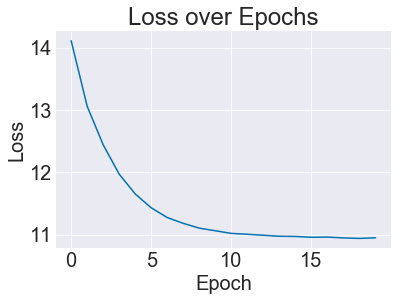

In [355]:
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.title('Loss over Epochs')
plt.plot(loss)
 
plt.show()

In [357]:
word_vecs = net.get_all_word_vectors(word2ind, unique_words)
word_vectors = word_vecs 
word_strings = unique_words

In [369]:
word_vectors.shape

(1666, 10)

Our loss is pretty much the same as with 10. 

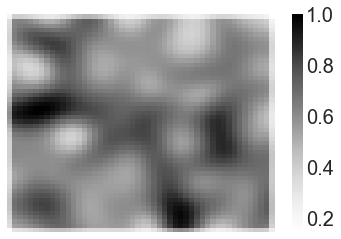

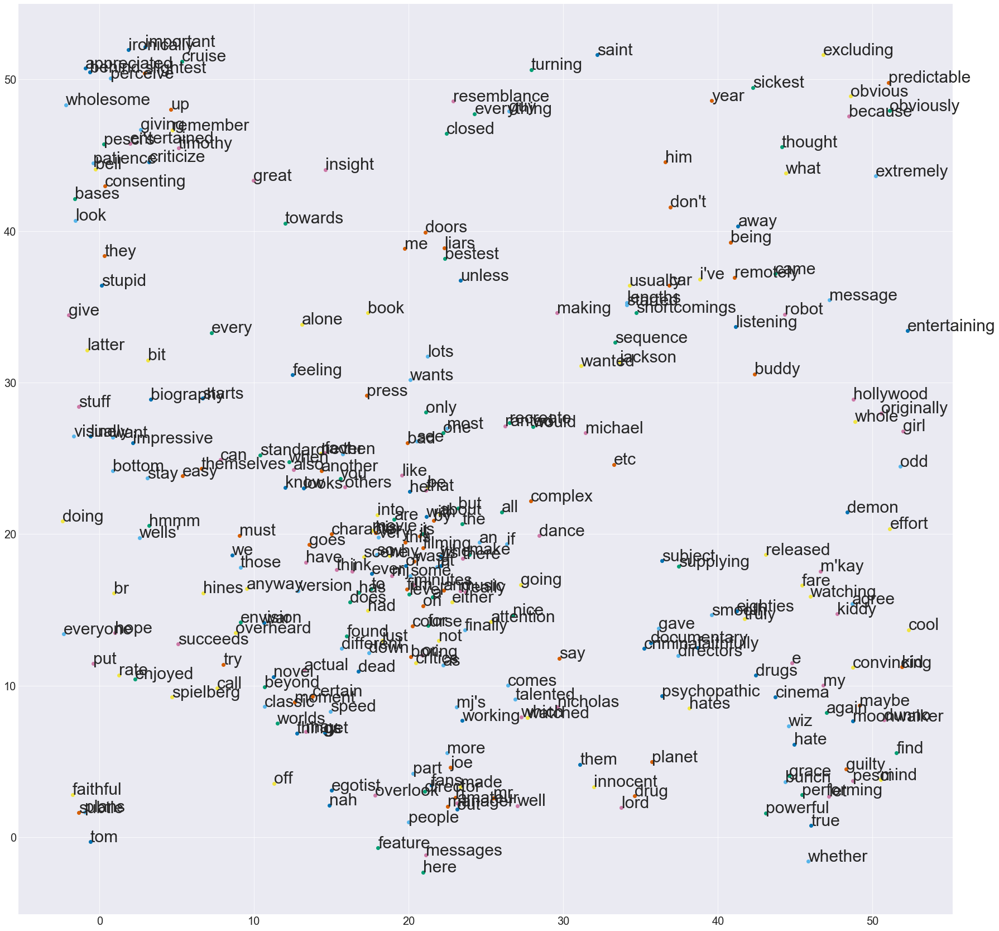

In [360]:
som_sz = 50
n_features = 10
max_iter = 50000
imbd_som7 = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som7.fit(word_vectors.copy())
word_u_map7 = imbd_som7.u_matrix()
 
plt.pcolor(word_u_map2.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

num_words_to_visualize = 300
jitter = 3

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som7.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()

In [361]:
print(f'Quantization error after {max_iter} iterations: {imbd_som7.error(word_vectors.copy()):.2f}')

Quantization error after 50000 iterations: 4.46


Similar word clusters that we continue to see are "innocent", "drug", and "lord". We see with the quantization errro that 50,000 iterations no longer seem adequate anymore so we bumped it up to 100k iterations and a som size of 100. 

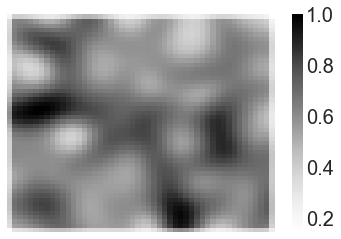

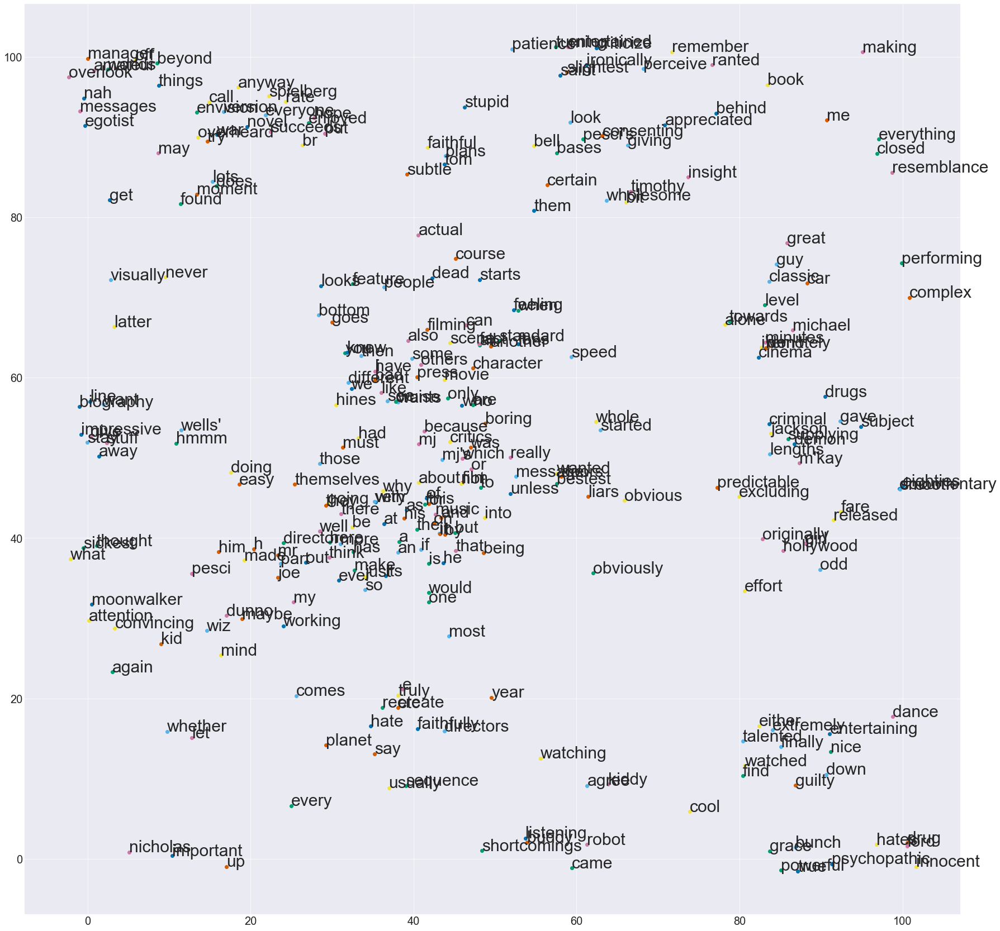

In [364]:
som_sz = 100
n_features = 10
max_iter = 100000
imbd_som7 = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som7.fit(word_vectors.copy())
word_u_map7 = imbd_som7.u_matrix()
 
plt.pcolor(word_u_map2.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

num_words_to_visualize = 300
jitter = 3

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som7.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()

In [365]:
print(f'Quantization error after {max_iter} iterations: {imbd_som7.error(word_vectors.copy()):.2f}')

Quantization error after 100000 iterations: 3.38


Interestingly, this wordcloud does not have "michael", "jackson" and "mj" nearby each other. Next to "jackson" is "criminal" and "drugs" which doesn't have as much of a postive image on the singer-dancer. Like in the previous wordclouds, "drug", "lord", and "innocent" are nearby insinuating that there is a pretty strong connection. Interestingly, next to "drug" and "lord" is now "hate", "pschopath" and "powerful". However, overall, we don't think this wordcloud is clear as our previous ones. We wanted to make sure we weren't getting a mediocre som because we still weren't training enough so we doubled our iterations to 200k.  

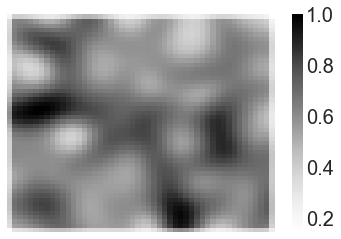

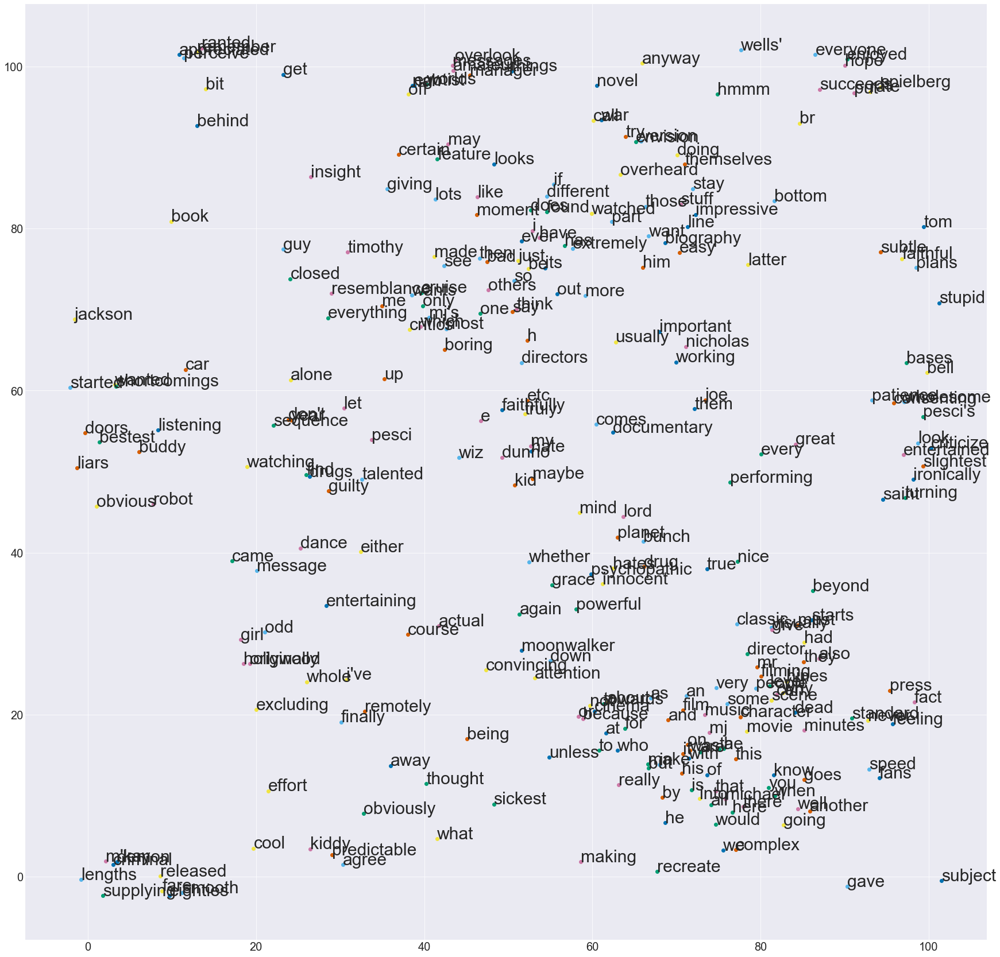

In [370]:
som_sz = 100
n_features = 10
max_iter = 200000
imbd_som7 = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
imbd_som7.fit(word_vectors.copy())
word_u_map7 = imbd_som7.u_matrix()
 
plt.pcolor(word_u_map2.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

num_words_to_visualize = 300
jitter = 3

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors[:num_words_to_visualize])):
    bmu_pos = imbd_som7.get_bmu(word_vectors[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings[i]), (x, y), fontsize=30)
plt.show()

In [371]:
print(f'Quantization error after {max_iter} iterations: {imbd_som7.error(word_vectors.copy()):.2f}')

Quantization error after 200000 iterations: 3.35


Our error is marginally smaller but there are some condensed cluster pockets. That being said, there is one oversized cluster, could just be separate clusters next to each other giving the sense of one big cluster, and there are a lot of words that are floating around without any meaningful connections. 

## Trying New Dataset 

link to dataset:https://github.com/minimaxir/textgenrnn/blob/master/datasets/reddit_rarepuppers_politics_2000_context.csv

So what's the difference between cute dogs (rarepuppers) and nasty partisan politics (politics) subreddit titles? The politics subreddit has the stereotype that most of the users just read the titles and then comment their reactions to the title instead of actually reading the post. For rarepuppers, I'm not really sure if there's the kind of person who would only read the title and not look at the cute images. So we wanted to explore more about the words being used in titles and whether we could make some connections and see clusters by both topic and subreddit. 

In [402]:
df2 = pd.read_csv('Data/reddit_rarepuppers_politics_2000_context.csv', header = 0)
df2 =  df2[['context_label','title']]
print(df2)
titles   = df2['title'].values.tolist()
 
corpus = word2vec.make_corpus(titles)
print(f'There are {len(corpus)} sentences in the corpus.')
unique_words = word2vec.find_unique_words(corpus)
vocab_sz = len(unique_words)
print(f'There are {vocab_sz} words in the vocabulary.')
word2ind = word2vec.make_word2ind_mapping(unique_words)
ind2word = word2vec.make_ind2word_mapping(unique_words)
targets_onehot, contexts_int = word2vec.make_target_context_word_lists(corpus, word2ind, vocab_sz)
 


     context_label                                              title
0         politics  Trump revealed highly classified information t...
1         politics  The FCC’s craven net neutrality vote announcem...
2         politics  A petition calling for FCC Chairman Ajit Pai t...
3         politics  The FCC has unveiled its plan to repeal its ne...
4         politics  ‘Cards Against Humanity’ Creator Just Pledged ...
...            ...                                                ...
1995   rarepuppers                             I gof sctung by a bfee
1996   rarepuppers                 sneezey boye does himself a tumbel
1997   rarepuppers               just a coupel of S A L T Y B O Y E S
1998   rarepuppers      Robbo pupper does big boye a heckin bamboozle
1999   rarepuppers                                Many faces of shoob

[2000 rows x 2 columns]
There are 1805 sentences in the corpus.
There are 4326 words in the vocabulary.


In [406]:
embedding_sz = 2
net = word2vec.Skipgram(input_shape=(1, vocab_sz),
                        dense_interior_units=(embedding_sz,),
                        n_classes=vocab_sz,
                        wt_scale=1e-1)
net.compile('adam', lr = 0.01)
loss = net.fit(targets_onehot, contexts_int, n_epochs=20, print_every=1)

Starting to train (20 epochs)...
Finished epoch 0/20. Epoch Loss: 9.590
Finished epoch 1/20. Epoch Loss: 9.347
Finished epoch 2/20. Epoch Loss: 9.265
Finished epoch 3/20. Epoch Loss: 9.208
Finished epoch 4/20. Epoch Loss: 9.165
Finished epoch 5/20. Epoch Loss: 9.134
Finished epoch 6/20. Epoch Loss: 9.109
Finished epoch 7/20. Epoch Loss: 9.090
Finished epoch 8/20. Epoch Loss: 9.075
Finished epoch 9/20. Epoch Loss: 9.063
Finished epoch 10/20. Epoch Loss: 9.053
Finished epoch 11/20. Epoch Loss: 9.044
Finished epoch 12/20. Epoch Loss: 9.038
Finished epoch 13/20. Epoch Loss: 9.032
Finished epoch 14/20. Epoch Loss: 9.027
Finished epoch 15/20. Epoch Loss: 9.024
Finished epoch 16/20. Epoch Loss: 9.020
Finished epoch 17/20. Epoch Loss: 9.017
Finished epoch 18/20. Epoch Loss: 9.015
Finished epoch 19/20. Epoch Loss: 9.013


In [407]:
word_vecs = net.get_all_word_vectors(word2ind, unique_words)
word_vectors2 = word_vecs 
word_strings2 = unique_words

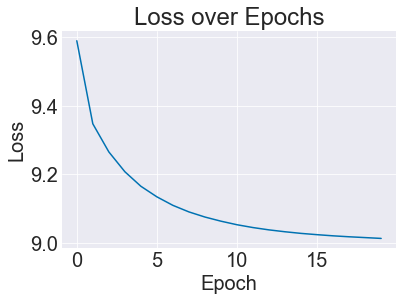

In [416]:
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.title('Loss over Epochs')
plt.plot(loss)
 
plt.show()

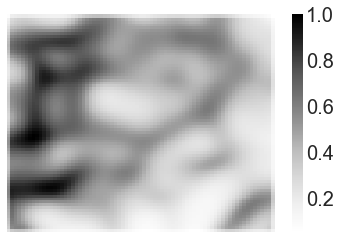

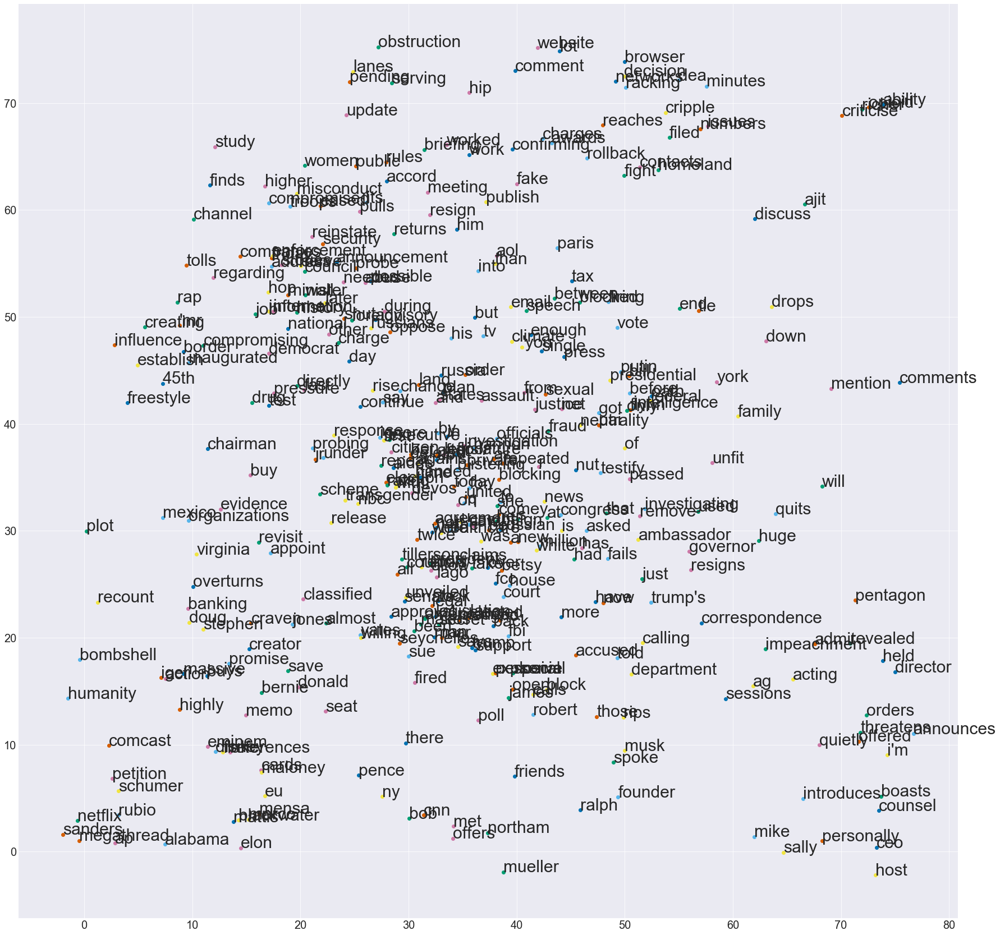

In [417]:
som_sz = 75
n_features = 2
max_iter = 200000
reddit_som = som.SOM(som_sz, n_features,max_iter = max_iter, init_lr=2, init_sigma=40, verbose=False)
reddit_som.fit(word_vectors2.copy())
word_u_map_reddit = reddit_som.u_matrix()
 
plt.pcolor(word_u_map_reddit.T)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

num_words_to_visualize = 400
jitter = 3

fig, ax = plt.subplots(figsize=(30, 30))
for i in range(len(word_vectors2[:num_words_to_visualize])):
    bmu_pos = reddit_som.get_bmu(word_vectors2[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings2[i]), (x, y), fontsize=30)
plt.show()

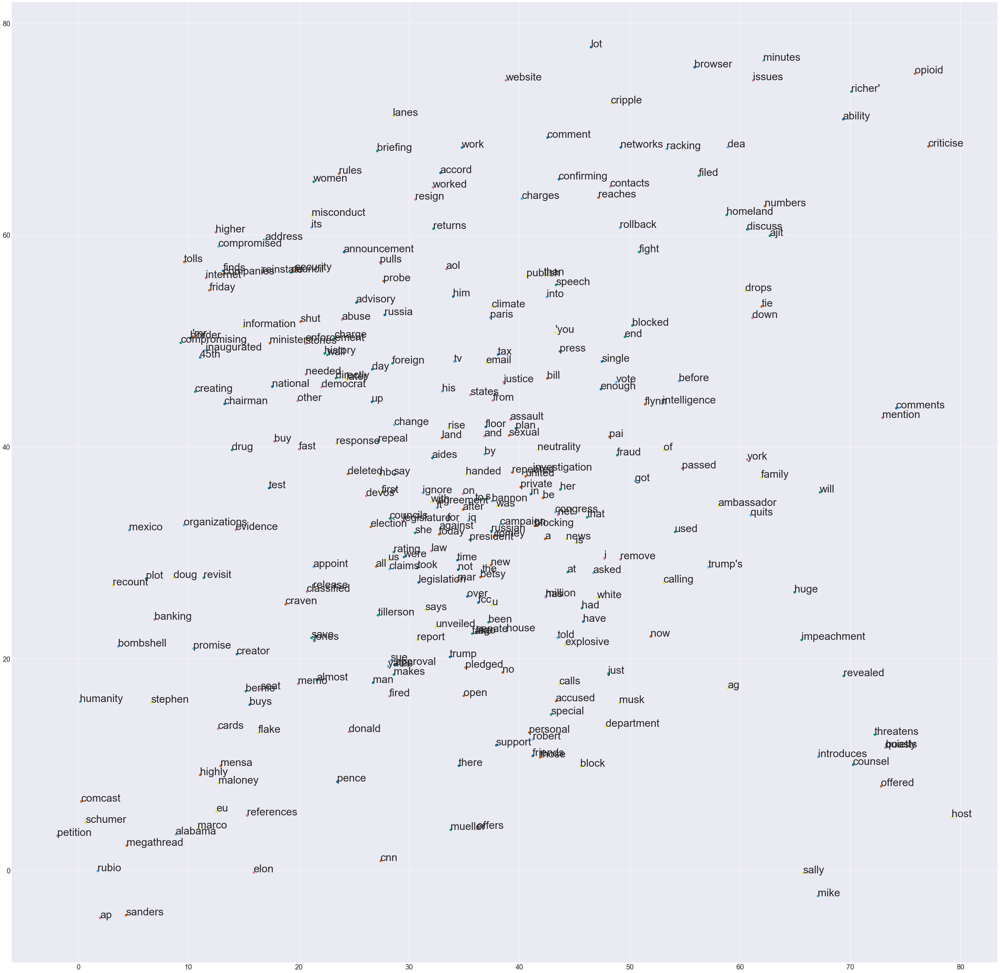

In [424]:
#decreasing number of words to make it a bit clearer 
num_words_to_visualize = 300
jitter = 5


fig, ax = plt.subplots(figsize=(50, 50))
for i in range(len(word_vectors2[:num_words_to_visualize])):
    bmu_pos = reddit_som.get_bmu(word_vectors2[i])
    # jitter the placement of words so that they are less likely to plot ontop of each other
    x = bmu_pos[0] + 0.5 + jitter*(2*np.random.random()-1)
    y = bmu_pos[1] + 0.5 + jitter*(2*np.random.random()-1)
    ax.scatter(x, y)
    ax.annotate(str(word_strings2[i]), (x, y), fontsize=30)
plt.show()

In [420]:
print(f'Quantization error after {max_iter} iterations: {reddit_som.error(word_vectors2.copy()):.2f}')

Quantization error after 200000 iterations: 0.19


Since we're not looking at all the words and all the politics headlines are at the top of the .csv file, we are only able to look at politics headlines. A possible way to go around this is to shuffle the rows in the raw dataset, however, due to time constraints, we aren't able to do this for this project. Overall, our word cloud isn't as clear as we want given that a lot of headlines uses similar words such as "trump", etc for a wide range of different titles. Some interesting word clumps "ambassador" and "quits", "climate" and "paris", and "pai" and "fraud". To improve our map, we might want to try training our skip-gram network longer since we are seeing some pretty big gaps such as "elon" being far away from "musk". 